In [3]:
import os
from glob import glob
import cv2
import matplotlib.pyplot as plt

In [8]:
def read_image(path):
    image = cv2.imread(path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # image를 RGB순으로 읽음
    return image

In [10]:
# image path
data_dir = '~/.kaggle/competitions/state-farm-distracted-driver-detection/imgs/'
train_path = data_dir+'train/c0/'
filename = 'img_100026.jpg'

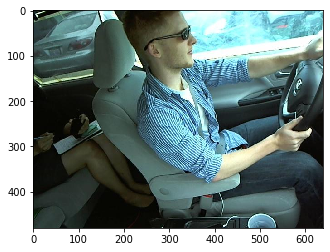

In [22]:
image = read_image(train_path+filename)
plt.imshow(image)

# Train data

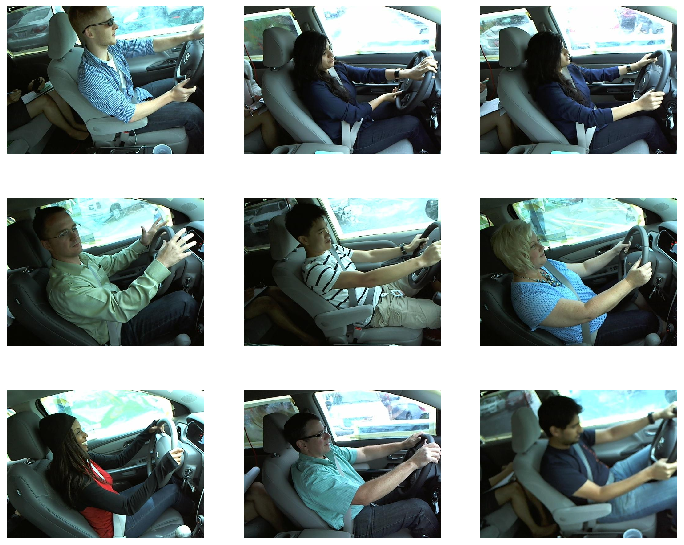

				# c0 : 안전운전


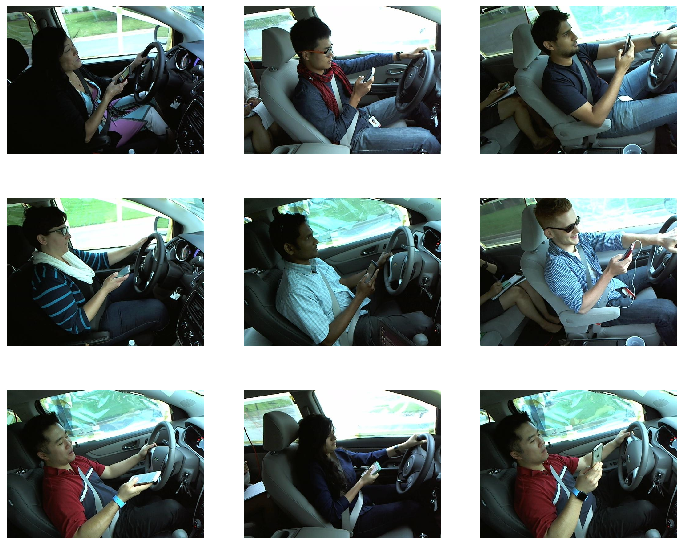

				# c1 : 오른손 문자


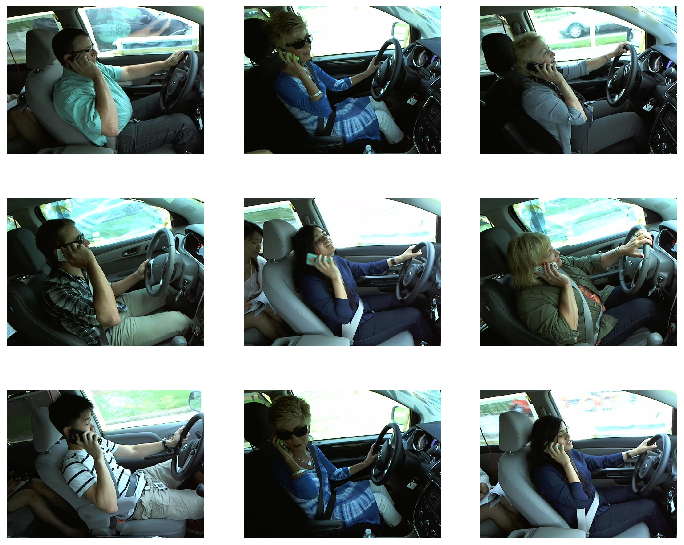

				# c2 : 오른손 전화


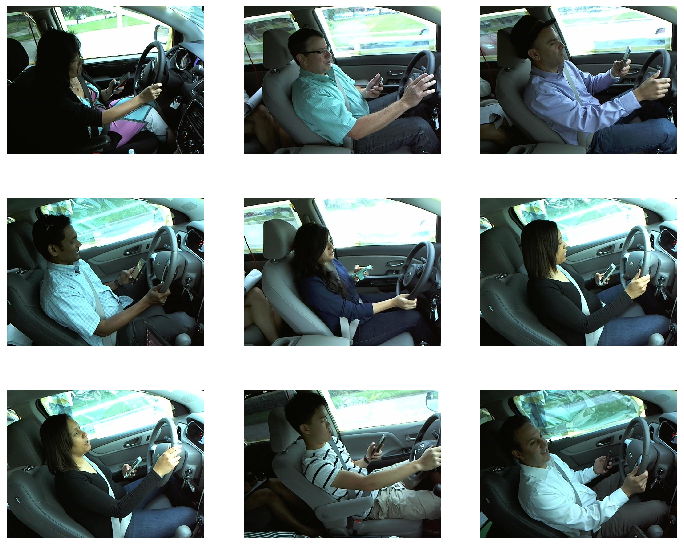

				# c3 : 왼손 문자


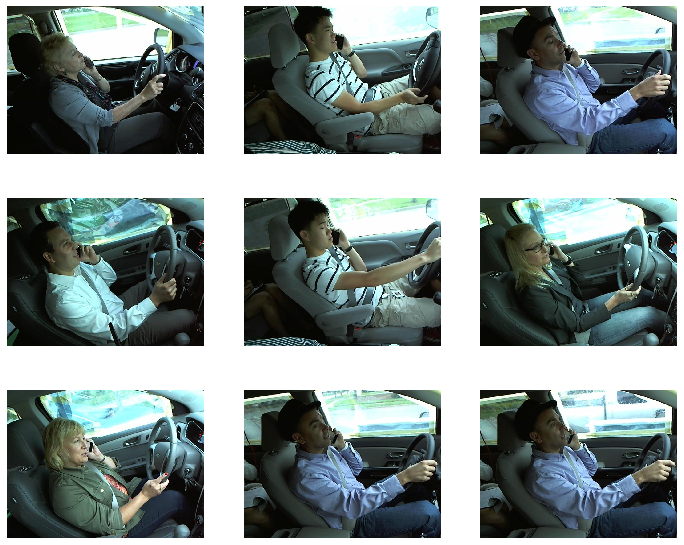

				# c4 : 왼손 전화


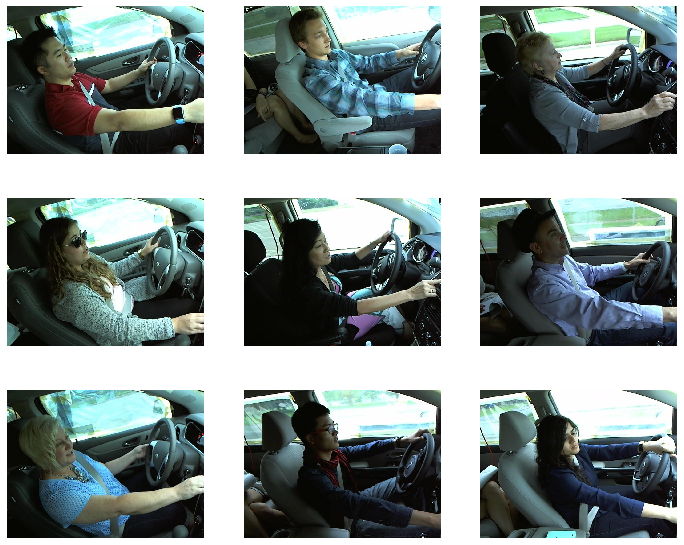

				# c5 : 라디오 조작


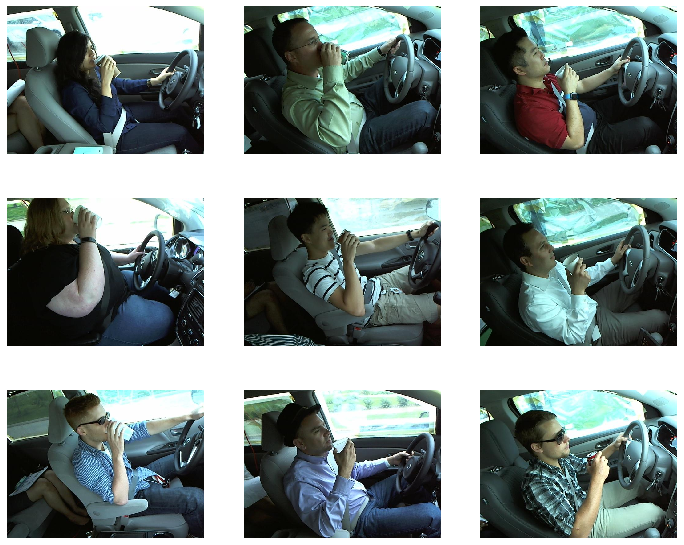

				# c6 : 음료수 섭취


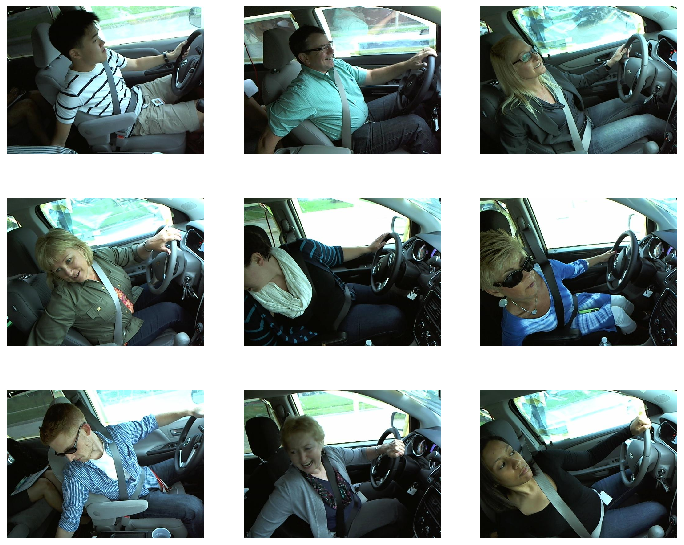

				# c7 : 뒷자석 손 뻗기


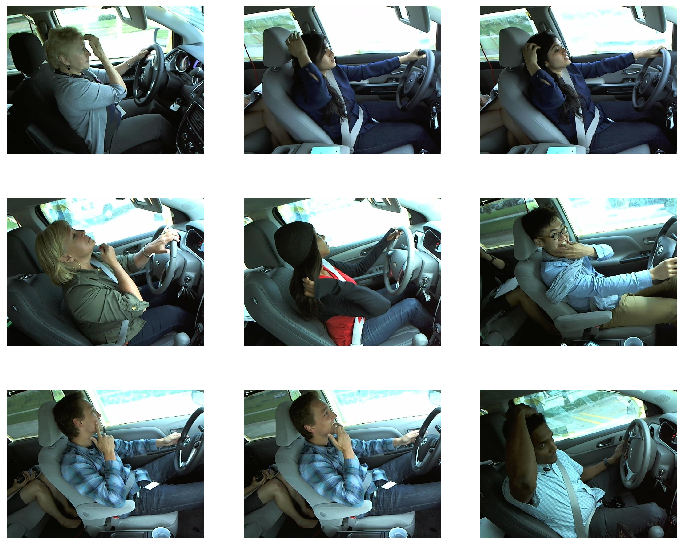

				# c8 : 얼굴, 머리 만지기


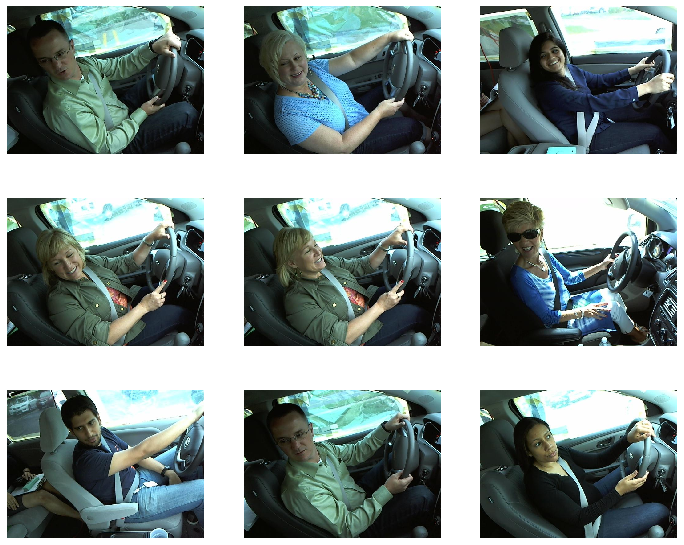

				# c9 : 조수석과 대화


In [21]:
labels = ['c0','c1','c2','c3','c4','c5','c6','c7','c8','c9']
col_to_kor = {
    'c0': '안전운전',
    'c1': '오른손 문자',
    'c2': '오른손 전화',
    'c3': '왼손 문자',
    'c4': '왼손 전화',
    'c5': '라디오 조작',
    'c6': '음료수 섭취',
    'c7': '뒷자석 손 뻗기',
    'c8': '얼굴, 머리 만지기',
    'c9': '조수석과 대화'
}

# 클래스별 9개씩 이미지 시각화
for label in labels:
    f, ax = plt.subplots(figsize=(12,10))
    files = glob('{}/train/{}/*.jpg'.format(data_dir, label))
    
    for x in range(9):
        plt.subplot(3, 3, x+1)
        image = read_image(files[x])
        plt.imshow(image)
        plt.axis('off')

    plt.show()
    print('\t\t\t\t# {} : {}'.format(label, col_to_kor[label]))

# Test data

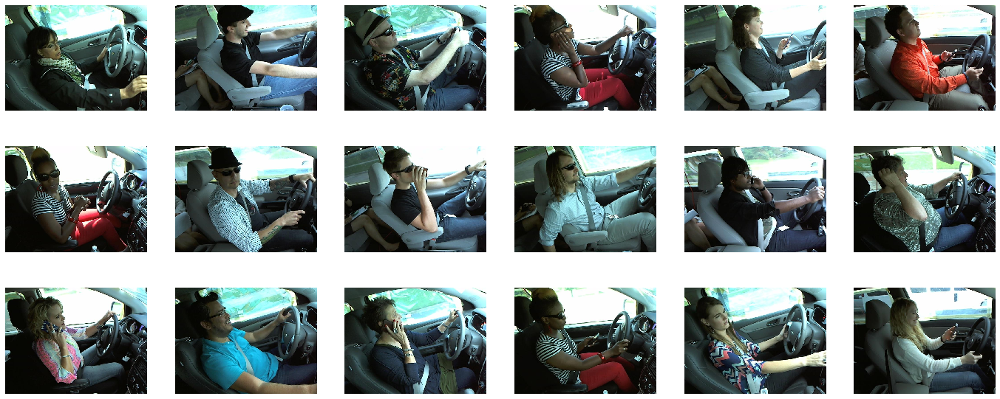

In [24]:
# test data 임의 이미지 시각화
f, ax = plt.subplots(figsize=(24, 10))
files = glob('{}/test/*.jpg'.format(data_dir))

# 18개 이미지 시각화
for x in range(18):
    plt.subplot(3, 6, x+1)
    image = read_image(files[x])
    plt.imshow(image)
    plt.axis('off')

# Driver meta data

In [27]:
import pandas as pd 
import numpy as np

In [44]:
driver_list = pd.read_csv('~/.kaggle/competitions/state-farm-distracted-driver-detection/driver_imgs_list.csv')
driver_list.head()

,subject,classname,img
0,p002,c0,img_44733.jpg
1,p002,c0,img_72999.jpg
2,p002,c0,img_25094.jpg
3,p002,c0,img_69092.jpg
4,p002,c0,img_92629.jpg


In [30]:
# 운전자 ID 고유값 개수 출력
unique_driver = len(np.unique(driver_list['subject']).tolist())
print('총 {}명의 운전자'.format(unique_driver))

총 26명의 운전자


## 운전자 별 클래스 이미지 시각화

In [37]:
# 운전자 별 이미지 저장 dict
driver_to_img = {} # 운전자 별 이미지 저장 dict
for i, row in driver_list.iterrows():
    driver = row['subject']
    label = row['classname']
    image_path = row['img']
    if not driver_to_img.get(driver, False):
        driver_to_img[driver] = [image_path]
    else:
        driver_to_img.get(driver).append(image_path)

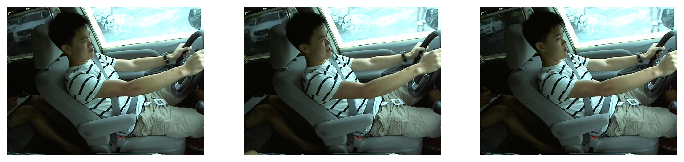

				# 운전자 : p002 | 클래스 : "c0 : 안전운전"


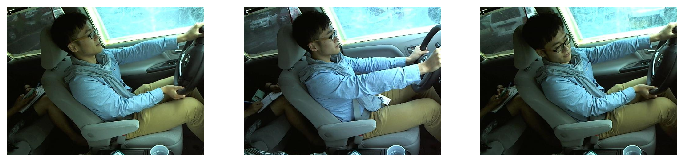

				# 운전자 : p012 | 클래스 : "c0 : 안전운전"


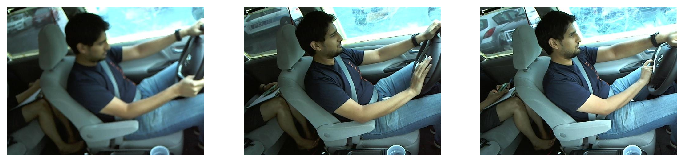

				# 운전자 : p014 | 클래스 : "c0 : 안전운전"


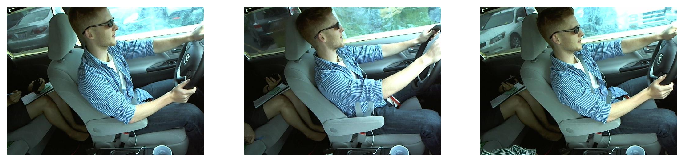

				# 운전자 : p015 | 클래스 : "c0 : 안전운전"


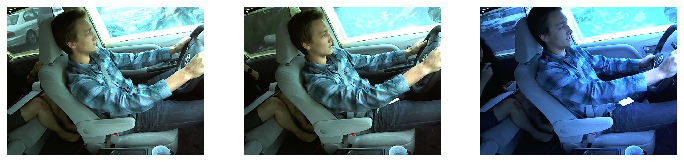

				# 운전자 : p016 | 클래스 : "c0 : 안전운전"


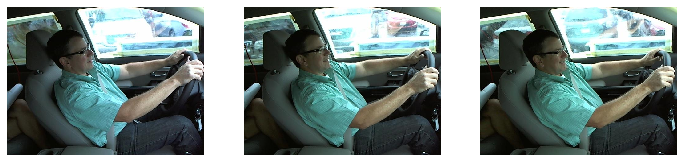

				# 운전자 : p021 | 클래스 : "c0 : 안전운전"


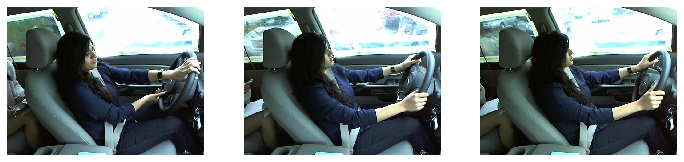

				# 운전자 : p022 | 클래스 : "c0 : 안전운전"


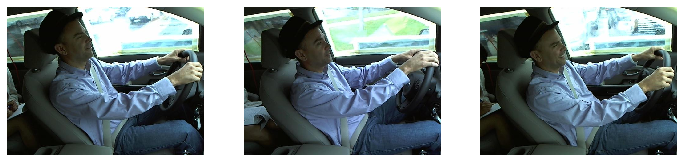

				# 운전자 : p024 | 클래스 : "c0 : 안전운전"


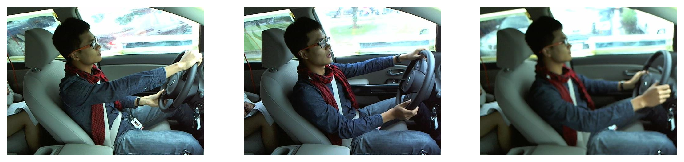

				# 운전자 : p026 | 클래스 : "c0 : 안전운전"


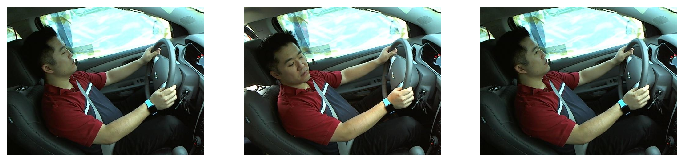

				# 운전자 : p035 | 클래스 : "c0 : 안전운전"


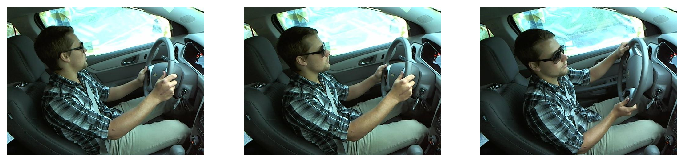

				# 운전자 : p039 | 클래스 : "c0 : 안전운전"


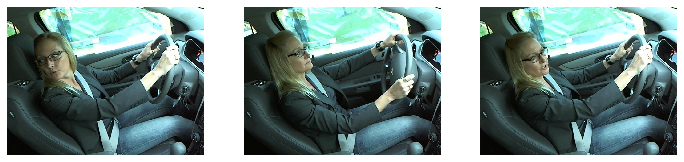

				# 운전자 : p041 | 클래스 : "c0 : 안전운전"


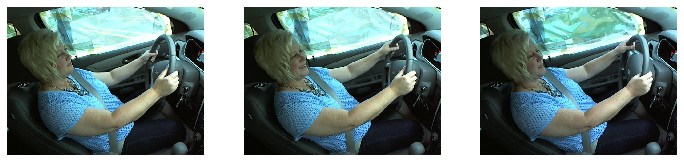

				# 운전자 : p042 | 클래스 : "c0 : 안전운전"


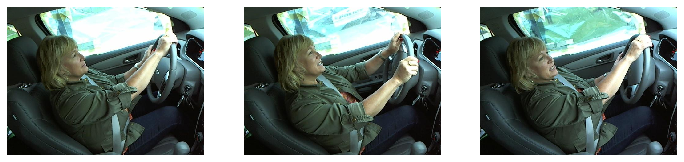

				# 운전자 : p045 | 클래스 : "c0 : 안전운전"


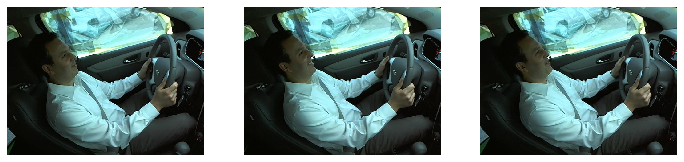

				# 운전자 : p047 | 클래스 : "c0 : 안전운전"


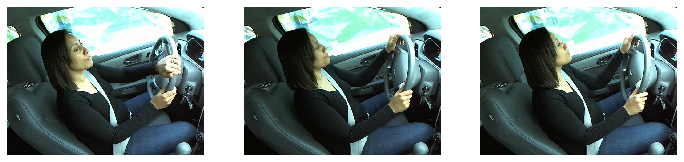

				# 운전자 : p049 | 클래스 : "c0 : 안전운전"


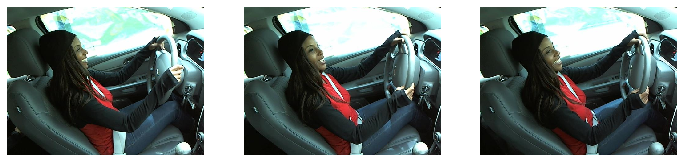

				# 운전자 : p050 | 클래스 : "c0 : 안전운전"


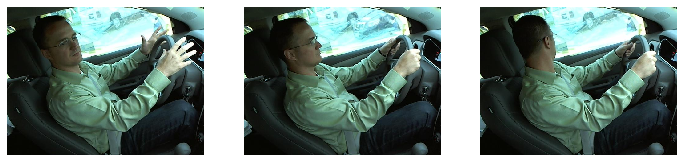

				# 운전자 : p051 | 클래스 : "c0 : 안전운전"


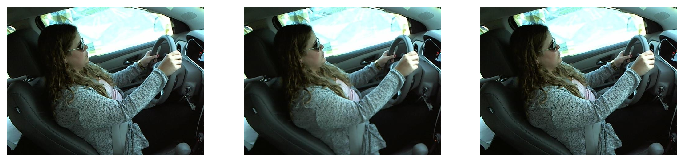

				# 운전자 : p052 | 클래스 : "c0 : 안전운전"


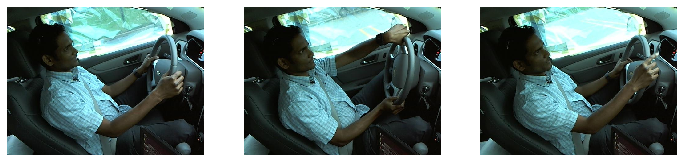

				# 운전자 : p056 | 클래스 : "c0 : 안전운전"


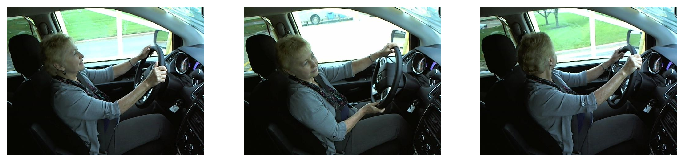

				# 운전자 : p061 | 클래스 : "c0 : 안전운전"


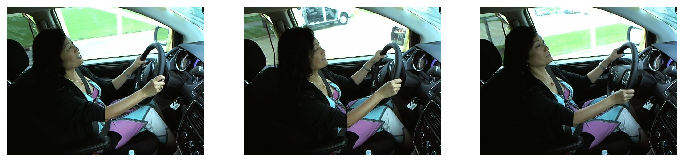

				# 운전자 : p064 | 클래스 : "c0 : 안전운전"


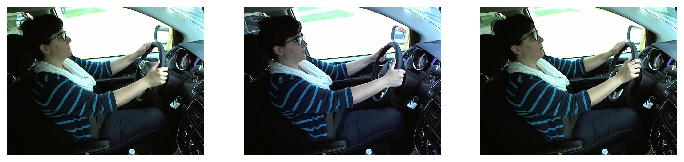

				# 운전자 : p066 | 클래스 : "c0 : 안전운전"


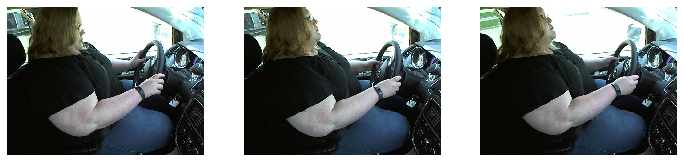

				# 운전자 : p072 | 클래스 : "c0 : 안전운전"


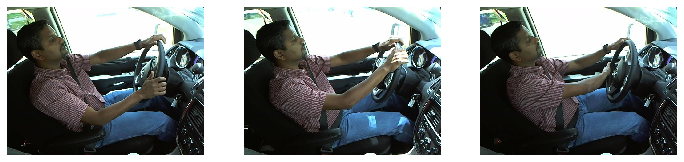

				# 운전자 : p075 | 클래스 : "c0 : 안전운전"


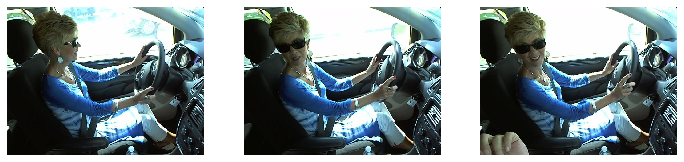

				# 운전자 : p081 | 클래스 : "c0 : 안전운전"


In [43]:
# 운전자별 훈련 데이터 예시 시각화
for driver in np.unique(driver_list['subject']).tolist():
    for label in labels[:1]: # 너무 많으니 'c0'만.. 
        f, ax = plt.subplots(figsize=(12, 10))
        files = glob('{}/train/{}/*.jpg'.format(data_dir, label))
        print_files = []
        for fl in files:
            if (driver_list[driver_list['img'] == os.path.basename(fl)]['subject'] == driver).values[0]:
                print_files.append(fl)
                
        # 총 9개의 이미지 시각화
        for x in range(3):
            plt.subplot(1, 3, x+1)
            image = read_image(print_files[x])
            plt.imshow(image)
            plt.axis('off')
        plt.show()
        
        print('\t\t\t\t# 운전자 : {} | 클래스 : "{} : {}"'.format(driver, label, col_to_kor[label]))